# Opgave Pytorch
## Bagtanker

Her er opgaverne som skal give jer en introduktion til hvor i kan implementere et simplt neuralt netværk ved hjælp af pytorch.

Der kommer til at være noget general struktur i koden for at i hurtigere kan komme igang med at lave nogle netværk og prøve på dataen

## Pakker
Her er alle pakker som i burde skulle bruge til at få et virkede neuralt netværk.

### Installation og Import

Først installerer vi de nødvendige pakker:
- **kagglehub**: Til at downloade datasæt fra Kaggle
- **corner**: Til at lave corner plots for data visualisering
- **seaborn**: Til smukke statistiske visualiseringer

**Installation:**
```bash
!pip install -q kagglehub corner seaborn
```

**Imports:**
```python
# PyTorch - Det primære machine learning framework
import torch
import torch.nn as nn

# VIGTIGT: Force CPU mode for kompatibilitet
# Udkommentér denne linje hvis du vil bruge GPU (hvis tilgængelig)
# torch.set_default_device("cpu")
```

### CPU vs GPU Håndtering

**Hvornår skal I udkommentere `torch.set_default_device("cpu")`:**
- Når I har en GPU og vil bruge den til hurtigere træning
- Når I arbejder med store datasæt (>10,000 samples)
- Når jeres model har mange parametre og træning tager lang tid

**Hvornår skal I beholde CPU force:**
- Når I lærer grundlæggende koncepter (mindre kompleksitet)
- Hvis I får GPU memory errors
- Når I debugger kode (CPU er ofte mere stabil)
- Hvis jeres GPU drivers ikke virker korrekt

**Sådan tjekker I GPU status:**
```python
print(f"CUDA available: {torch.cuda.is_available()}")
print(f"Current device: {device}")
if torch.cuda.is_available():
    print(f"GPU device name: {torch.cuda.get_device_name(0)}")
```

### Resterende Imports

```python
# Standard data science biblioteker
import numpy as np          # Numeriske beregninger og arrays
import matplotlib.pyplot as plt  # Plotting og visualisering
import seaborn as sns       # Statistiske plots og smukke grafer

# Vores custom import til datasæt og træning
from NN_import import load_dataset, device, train_model
```

### Pakke Forklaringer

#### PyTorch Komponenter
- **torch**: Grundlæggende tensor operationer og matematik
- **torch.nn**: Neurale netværk komponenter (lag, aktiveringer, loss funktioner)
- **torch.optim**: Optimizers (Adam, SGD, etc.) - importeres automatisk i train_model
- **torch.utils.data**: DataLoader og Dataset klasser - bruges internt

#### Visualisering og Data
- **numpy**: Håndtering af numeriske data og arrays
- **matplotlib.pyplot**: Grundlæggende plotting funktioner
- **seaborn**: Statistiske visualiseringer og smukke plots
- **corner**: Specialiseret til corner plots (pairwise scatter plots)

#### Custom Imports
- **load_dataset**: Vores funktion til at indlæse og preprocesse data
- **device**: Automatisk CPU/GPU detection
- **train_model**: Komplet trænings pipeline

### Troubleshooting

**Hvis I får CUDA errors:**
- Udkommentér `torch.set_default_device("cpu")` linjen

**Hvis visualiseringer ikke virker:**
- Sørg for at I har `matplotlib` og `seaborn` installeret
- Tjek at I kører i et miljø der understøtter plotting (Jupyter)

### GPU Performance Tips

**Hvornår GPU giver størst fordel:**
- Store datasæt (>50,000 samples)
- Dybe netværk (>3-4 lag)
- Mange trænings epochs (>100)
- Komplekse arkitekturer

**Hvornår CPU kan være hurtigere:**
- Meget små datasæt (<1,000 samples)
- Simple netværk (1-2 lag)
- Få epochs (<20)
- Debugging og eksperimentering

In [47]:
!pip install -q kagglehub corner seaborn

import torch
import torch.nn as nn
# Force CPU for compatibility
#torch.set_default_device("cpu")

# Import necessary libraries
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from NN_import import load_dataset, device, train_model

## Data

Her har vi forberedt 5 forskellige datasæt som er formateret og klar til brug. Data preprocessing og cleaning er en af de vigtigste dele af Machine Learning, men det er gjort for jer, så I kan fokusere på at lære om neurale netværk.

### Oversigt over Datasæt

| Dataset | Type | Target | Anvendelse |
|---------|------|--------|------------|
| `"particle"` | Regression | Invariant masse | Partikelfysik |
| `"weather"` | Regression | Apparent temperatur | Vejrforudsigelse |
| `"grades"` | Dual (Regression + Klassifikation) | GPA + GradeClass | Studieresultater |
| `"avocado"` | Klassifikation | Modenhed | Kvalitetsvurdering |
| `"diabetes"` | Klassifikation | Diabetes risiko | Sundhedsvurdering |

### Detaljerede Beskrivelser

#### 🔬 Partikelfysik (`"particle"`)
**Type:** Regression  
**Beskrivelse:** Elektron-par kollisioner i en partikeldetektor  
**Mål:** Forudsig den invariante masse (energi) af partikelparet  
**Target:** `M` (masse) - kontinuerlig værdi  
**Features:** Kinetiske egenskaber fra detektormålinger  
**Anvendelse:** Opdagelse af nye partikler i fysikeksperimenter

#### 🌤️ Vejrdata (`"weather"`)
**Type:** Regression  
**Beskrivelse:** Meteorologiske observationer fra Szeged  
**Mål:** Forudsig apparent temperatur ud fra vejrforhold  
**Target:** `"Apparent Temperature (C)"` - kontinuerlig værdi  
**Features:** Temperatur, luftfugtighed, vindstyrke, barometertryk m.m.  
**Anvendelse:** Vejrforudsigelse og komfortindeks

#### 🎓 Studerende Data (`"grades"`)
**Type:** Dual (både regression og klassifikation)  
**Beskrivelse:** Studerendes akademiske præstation  
**Mål:** Forudsig både GPA (regression) og karakterkategori (klassifikation)  
**Target:** 
- `GPA` (regression): Kontinuerligt karaktergennemsnit (0.0-4.0)
- `GradeClass` (klassifikation): Kategorisk karakterniveau (A, B, C, D, F) - **one-hot encoded**
**Features:** Studietid, forældrestøtte, alder, tidligere karakterer  
**Anvendelse:** Uddannelsesplanlægning og tidlig intervention

#### 🥑 Avocado Data (`"avocado"`)
**Type:** Klassifikation  
**Beskrivelse:** Kvalitetsvurdering af avocadoer  
**Mål:** Klassificer modenhedsgrad ud fra fysiske egenskaber  
**Target:** `"ripeness"` - **one-hot encoded** kategorier (moden, fast-moden, umoden osv.)  
**Features:** Hårdhed, farve, størrelse, vægt  
**Anvendelse:** Kvalitetskontrol i fødevareindustrien

#### 🏥 Diabetes Data (`"diabetes"`)
**Type:** Klassifikation  
**Beskrivelse:** Sundhedsrisiko vurdering  
**Mål:** Forudsig diabetes risiko ud fra livsstilsfaktorer  
**Target:** `"Diabetes_012"` - **one-hot encoded** (0=ingen, 1=pre-diabetes, 2=diabetes)  
**Features:** BMI, fysisk aktivitet, kost, alder, køn, rygning  
**Anvendelse:** Forebyggende sundhedspleje og risikoscreening

### Target Encoding Forklaring

#### One-Hot Encoding
**Hvad er one-hot encoding?**
One-hot encoding er en måde at repræsentere kategoriske data på i en format som neurale netværk kan forstå. I stedet for at bruge tal som 0, 1, 2 for kategorier, opretter vi separate binære kolonner for hver kategori.

**Eksempel med 3 klasser (A, B, C):**
```
Original:  A  →  [1, 0, 0]
          B  →  [0, 1, 0]  
          C  →  [0, 0, 1]
```

**Hvorfor bruger vi one-hot encoding?**
- **Undgår ordinær bias**: Tal som 0, 1, 2 antyder en rækkefølge/hierarki der ikke findes
- **Bedre læring**: Netværket kan lære forskellige mønstre for hver klasse uafhængigt
- **Matematisk korrekt**: Fungerer optimalt med softmax aktivering og CrossEntropy loss

#### Target Format Per Dataset

**Regression (Particle, Weather, Grades-GPA):**
```python
# Kontinuerlige værdier (normaliserede)
train_targets_tensor.shape  # [N, 1] eller [N] - enkelt værdi per sample
```

**Binær Klassifikation (Avocado med ripeness_class="ripe"):**
```python
# 0 eller 1 for to klasser
train_targets_tensor.shape  # [N] - enkelt værdi (0/1) per sample
```

**Multiclass Klassifikation (Diabetes, Avocado-all, Grades-GradeClass):**
```python
# One-hot encoded - en kolonne per klasse
train_targets_tensor.shape  # [N, num_classes] - one-hot vektor per sample

# Eksempel for 3 klasser:
# Sample 0: [1, 0, 0] - tilhører klasse 0
# Sample 1: [0, 1, 0] - tilhører klasse 1
# Sample 2: [0, 0, 1] - tilhører klasse 2
```

### Brug af Datasættene

#### Grundlæggende Loading
```python
# Vælg dit datasæt
dataset_name = "particle"  # Skift til: "weather", "grades", "avocado", "diabetes"
validation = False         # Inkluder validation set (default: False)
visualize = False         # Vis data visualiseringer

# Load datasættet
data = load_dataset(dataset_name, validation=validation, visualize=visualize)
```

#### Tilgængelige Data Variabler
Efter loading har du adgang til:
- `X_train_tensor`, `X_test_tensor` - Input features (altid normaliserede)
- `train_targets_tensor`, `test_targets_tensor` - Target værdier (format afhænger af task type)  
- `X_val_tensor`, `val_targets_tensor` - Validation data (hvis `validation=True`)
- `input_size`, `output_size` - Netværksarkitektur dimensioner
- `data['task_type']` - 'regression' eller 'classification'
- `data['num_classes']` - Antal klasser (kun for klassifikation)
- `data['feature_names']` - Navne på input features

#### Output Size Guide
```python
# Regression: output_size = 1
if data['task_type'] == 'regression':
    print(f"Output layer should have {data['output_size']} neuron")

# Binary classification: output_size = 1  
elif data['num_classes'] == 1:
    print(f"Binary classification - output layer should have {data['output_size']} neuron")

# Multiclass classification: output_size = num_classes
else:
    print(f"Multiclass classification - output layer should have {data['output_size']} neurons")
```

#### Specielle Tilfælde

**Grades Dataset (Dual Target):**
```python
if dataset_name == "grades":
    # Regression target (GPA)
    gpa_targets = train_targets_tensor  # Shape: [N] - kontinuerligt
    # Klassifikation target (GradeClass)  
    grade_class_targets = data['train_targets2']  # Shape: [N, num_classes] - one-hot
    print(f"GPA target shape: {gpa_targets.shape}")
    print(f"GradeClass target shape: {grade_class_targets.shape}")
```

**Avocado Dataset (Binær vs. Multiclass):**
```python
# Binær klassifikation (ripe vs. andre)
data = load_dataset("avocado", ripeness_class="ripe")
print(f"Binary target shape: {data['train_targets'].shape}")  # [N]

# Multiclass klassifikation (alle kategorier)
data = load_dataset("avocado", ripeness_class="all")
print(f"Multiclass target shape: {data['train_targets'].shape}")  # [N, num_classes]
```

### Data Preprocessing Pipeline

Alle datasæt gennemgår automatisk standardisering:

1. **NaN Removal** - Rækker med manglende værdier fjernes helt
2. **Train/Val/Test Split** - Automatisk opdeling (80/10/10% hvis validation=True)
3. **Feature Normalization** - StandardScaler på input features (mean=0, std=1)
4. **Target Processing**:
   - **Regression**: StandardScaler normalisering (mean=0, std=1)
   - **Classification**: One-hot encoding for multiclass, binær for binary
5. **Tensor Conversion** - Konverteret til PyTorch tensors på korrekt device (CPU/GPU)

### Visualisering

Sæt `visualize=True` for at se:
- **Corner plots** - Pairwise feature relationships
- **Target distribution** - Histogram (regression) / bar plots (klassifikation)
- **Correlation matrix** - Feature korrelationer
- **Basic statistics** - Dataset størrelse og egenskaber

### Eksempel Output
```
Dataset: diabetes
Input size: 21
Output size: 3  
Task type: classification
Number of classes: 3
Training samples: 196036
Test samples: 21782
Feature names: ['HighBP', 'HighChol', 'CholCheck', ...]
Target shape: [196036, 3]  # One-hot encoded med 3 klasser
```

### Vigtige Pointer for Netværksdesign

**Output Layer Design:**
- **Regression**: `nn.Linear(hidden_size, 1)` + ingen aktivering
- **Binær klassifikation**: `nn.Linear(hidden_size, 1)` + sigmoid (eller BCEWithLogitsLoss)
- **Multiclass**: `nn.Linear(hidden_size, num_classes)` + softmax

**Loss Function Matching:**
- **Regression**: MSELoss med kontinuerlige targets
- **Binær**: BCELoss med 0/1 targets  
- **Multiclass**: BCELoss med one-hot targets (eller CrossEntropyLoss med class indices)

Denne struktur sikrer at jeres netværk får data i det rigtige format og gør det nemt at eksperimentere med forskellige arkitekturer på forskellige problemtyper.

Original dataset shape: (100000, 19)
After removing NaN values: (99915, 19)
Removed 85 rows with NaN values

=== Dataset Visualization: PARTICLE ===
Showing 8 features out of 16 total features
Sample size for visualization: 2000

Dataset shape: (99915, 19)
Target column(s): M
Feature columns: 16
Corner plot failed: matplotlib.axes._axes.Axes.hist() got multiple values for keyword argument 'bins'
Creating alternative visualization...


<Figure size 1200x1000 with 0 Axes>

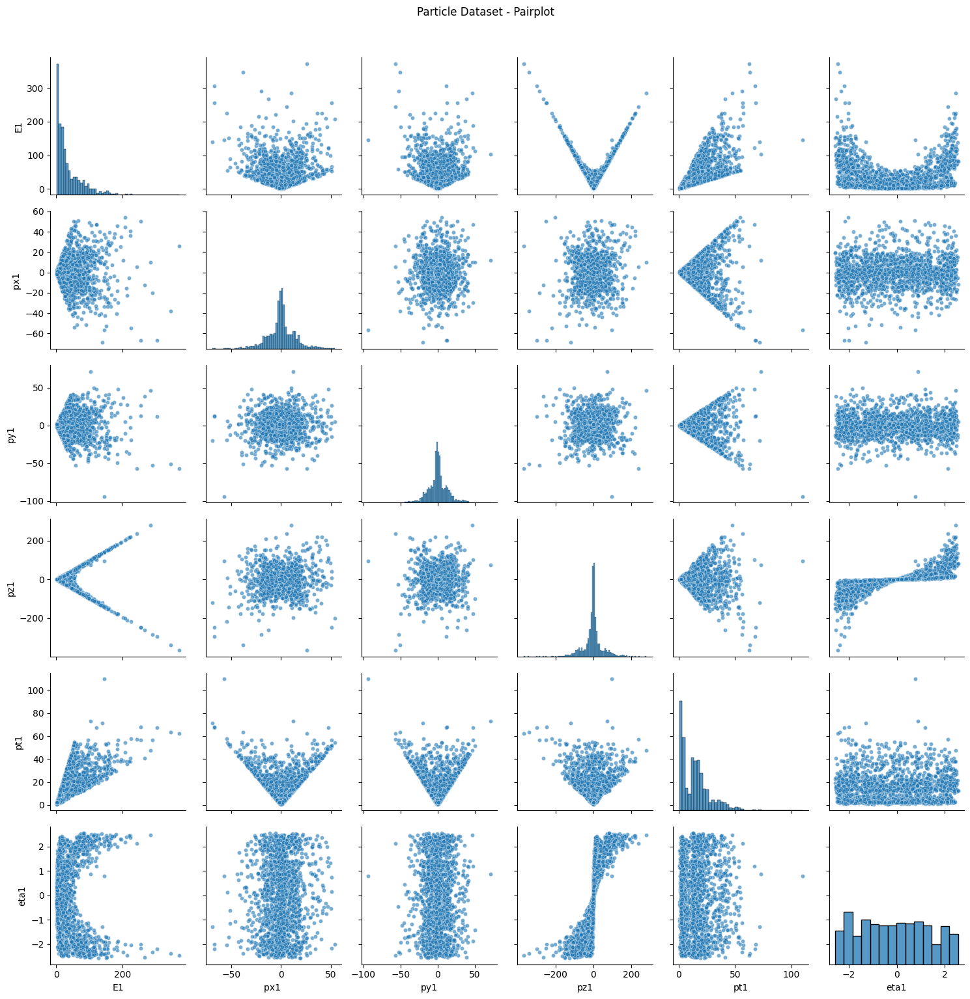

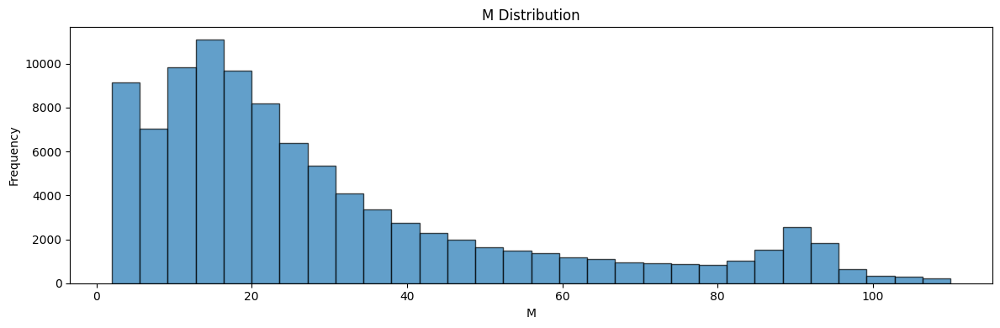

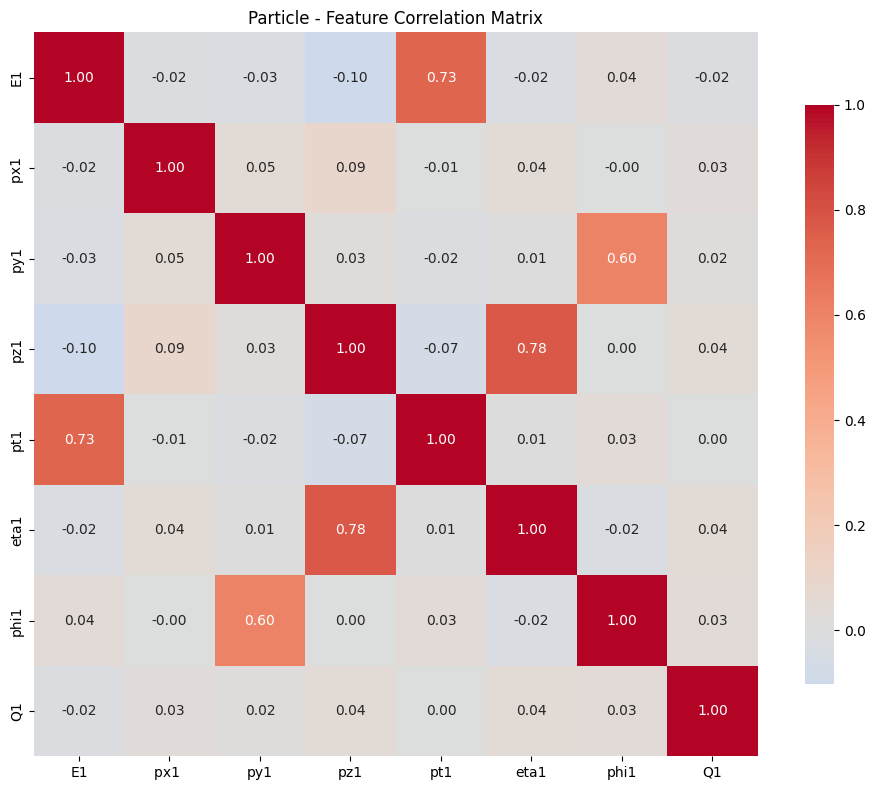

Task type: regression
Dataset: particle
Input size: 16
Output size: 1
Training samples: 89923
Test samples: 9992
Feature names: ['E1', 'px1 ', 'py1', 'pz1', 'pt1', 'eta1', 'phi1', 'Q1', 'E2', 'px2', 'py2', 'pz2', 'pt2', 'eta2', 'phi2', 'Q2']


In [48]:
# Load dataset with visualization
dataset_name = "particle"  # Options: "particle", "weather", "grades", "avocado", "diabetes"
validation = False # Set to True to include validation set
visualize = True  # Set to True to see data visualizations

data = load_dataset(dataset_name, validation=validation, visualize=visualize)

# Extract commonly used variables for convenience
X_train_tensor = data['X_train']
X_test_tensor = data['X_test']
train_targets_tensor = data['train_targets']  
test_targets_tensor = data['test_targets']    
input_size = data['input_size']
output_size = data['output_size']

# Get task type and number of classes from data
task_type = data.get('task_type', 'regression')
num_classes = data.get('num_classes', None)

print(f"Task type: {task_type}")
if task_type == 'classification' and num_classes:
    print(f"Number of classes: {num_classes}")

# Check if there are any NaN values in the training data
if torch.isnan(X_train_tensor).any():
    print("Warning: Training data contains NaN values. Consider preprocessing to handle them.")
if torch.isnan(train_targets_tensor).any():
    print("Warning: Training targets contain NaN values. Consider preprocessing to handle them.")

# Handle grades dataset with two targets
if dataset_name == "grades" and 'train_targets2' in data:
    train_targets_classification = data['train_targets2']  # GradeClass (classification)
    test_targets_classification = data['test_targets2']    # GradeClass (classification)
    if validation:
        val_targets_classification = data['val_targets2']   # GradeClass (classification)
    print(f"Regression target (GPA): {train_targets_tensor.shape}")
    print(f"Classification target (GradeClass): {train_targets_classification.shape}")

if validation:
    X_val_tensor = data['X_val']
    val_targets_tensor = data['val_targets']

print(f"Dataset: {data['dataset_name']}")
print(f"Input size: {input_size}")
print(f"Output size: {output_size}")
print(f"Training samples: {X_train_tensor.shape[0]}")
if validation:
    print(f"Validation samples: {X_val_tensor.shape[0]}")
print(f"Test samples: {X_test_tensor.shape[0]}")
print(f"Feature names: {data['feature_names']}")

## Simple Neural Network

Her er det mest simple netværk I kan lave - det har kun 1 input og 1 output lag. 

### Netværksarkitektur

Når I gerne vil lave flere lag, skal I bare sørge for at størrelserne passer sammen:

**Eksempel på lag-dimensioner:**
- Input lag: `input_size` → `hidden_size` (f.eks. 64)
- Hidden lag: `64` → `64` (eller anden størrelse)
- Output lag: `64` → `output_size`

### Vigtige Punkter

1. **Aktivering mellem lag**: Brug ReLU mellem hidden lag
2. **Output aktivering**: 
   - **Regression**: Ingen aktivering på output (lineær)
   - **Klassifikation**: Sigmoid (binær) eller ingen (multiclass med CrossEntropy)
3. **Lag størrelse**: Typiske hidden dimensioner er 32, 64, 128, 256

### Aktiveringsfunktioner

Aktiveringsfunktioner introducerer ikke-linearitet i netværket og gør det muligt at lære komplekse mønstre:

**Almindelige aktiveringsfunktioner:**
- `nn.ReLU()` - Rectified Linear Unit (mest populære)
- `nn.Sigmoid()` - Sigmoid funktion (0 til 1)
- `nn.Tanh()` - Tanh funktion (-1 til 1)
- `nn.LeakyReLU()` - Modificeret ReLU der ikke "dør"

**Hvornår bruger vi aktivering:**
```python
# Mellem lag (altid)
x = self.fc1(x)
x = self.relu(x)  # Aktivering mellem lag

# På output lag (kun for klassifikation)
x = self.fc_output(x)
# For regression: ingen aktivering
# For binær klassifikation: sigmoid
# For multiclass: ingen (bruger CrossEntropy loss)
```

### SimpleNN Forklaring

Dette eksempel viser strukturen, men har en fejl - ReLU skal ikke bruges på output ved regression:

```python
class SimpleNN(nn.Module):
    def __init__(self, input_size, output_size):
        super(SimpleNN, self).__init__()
        self.fc1 = nn.Linear(input_size, output_size)  # Direkte forbindelse
        # ReLU bruges normalt mellem lag, ikke på output
    
    def forward(self, x):
        x = self.fc1(x)  # For regression: ingen aktivering på output
        return x
```

### Brug af train_model Funktionen

`train_model` funktionen gør træning nemt ved at håndtere alle de tekniske detaljer:

```python
# Grundlæggende brug
history, trained_model = train_model(
    model=model, 
    X_train=X_train_tensor, 
    y_train=train_targets_tensor,
    task_type='regression'  # eller 'classification'
)
```

**Avancerede parametre:**
```python
history, trained_model = train_model(
    model=model,
    X_train=X_train_tensor,
    y_train=train_targets_tensor,
    X_val=X_val_tensor,           # Validation data (optional)
    y_val=val_targets_tensor,     # Validation targets (optional)
    X_test=X_test_tensor,         # Test data (optional)
    y_test=test_targets_tensor,   # Test targets (optional)
    task_type='regression',       # 'regression' eller 'classification'
    epochs=100,                   # Antal trænings epochs
    learning_rate=0.001,          # Learning rate for optimizer
    batch_size=32,                # Batch størrelse
    early_stopping_patience=10,   # Stop hvis ingen forbedring
    print_every=10               # Print status hver 10. epoch
)
```

**Hvad returnerer train_model:**
- `history`: Dictionary med trænings/validation loss over tid
- `trained_model`: Det trænede netværk klar til brug

**Automatiske features:**
- Vælger "rigtig" loss funktion (MSE/CrossEntropy)
- Adam optimizer
- Device handling (CPU/GPU)
- Early stopping ved validation
- Progress tracking

### Opgave

Nu skal I prøve at lave jeres eget netværk og træne det på et af datasættene. 

**Krav til jeres netværk:**
- 2-4 lag total (inkl. input og output lag)
- ReLU aktivering mellem hidden lag
- Passende output aktivering:
  - **Regression**: Ingen aktivering på output
  - **Binær klassifikation**: Sigmoid aktivering (kun én klasse output)
  - **Multiclass klassifikation**: Softmax aktivering (kun én klasse kan være sand)

**Om Binær Klassifikation:**
De tilgængelige datasæt er primært regression og multiclass klassifikation. For at eksperimentere med binær klassifikation kan I:
- Bruge avocado datasættet med `ripeness_class="ripe"` (ripe vs. andre)
- Modificere et multiclass dataset til binær (f.eks. konvertere diabetes til "diabetes vs. ingen diabetes")

**Test jeres netværk:**
Efter I har implementeret jeres netværk, test det med `train_model`s grundlæggende brug:

```python
# Grundlæggende træning
history, trained_model = train_model(
    model=model, 
    X_train=X_train_tensor, 
    y_train=train_targets_tensor,
    task_type='regression'  # eller 'classification'
)
```

**Tips:**
- Start simpelt (2-3 lag)
- Brug `hidden_size=64` til at starte med
- Husk at sætte korrekt `task_type` baseret på jeres dataset
- Tjek at jeres netværks dimensioner passer med `input_size` og `output_size`
- For binær klassifikation: brug sigmoid aktivering på output (værdi mellem 0-1)
- For multiclass: brug softmax aktivering på output (sandsynlighedsfordeling over klasser)

**Binær Klassifikation Eksempel:**
```python
# Load avocado dataset for binary classification
data = load_dataset("avocado", ripeness_class="ripe")
# Dette giver binary targets: ripe (1) vs. alle andre (0)

# Eller konverter multiclass til binary:
# For diabetes: konverter til "har diabetes" vs. "ingen diabetes"
if dataset_name == "diabetes":
    # Konverter one-hot encoded targets til binary
    # [1,0,0] -> 0 (ingen diabetes)
    # [0,1,0] eller [0,0,1] -> 1 (har diabetes)
    binary_targets = (train_targets_tensor[:, 1] + train_targets_tensor[:, 2]).unsqueeze(1)
    print(f"Binary target shape: {binary_targets.shape}")  # [N, 1]
```

**Train_model Loss Functions:**
> **Note:** `train_model` funktionen bruger automatisk BCELoss for klassifikation (både binær og multiclass) og MSELoss for regression. Dette betyder at for klassifikation skal jeres netværk have passende aktivering på output laget (sigmoid for binær, softmax for multiclass) da BCELoss forventer sandsynligheder mellem 0-1.

**Aktivering vs. Loss Function:**
- **Multiclass med Softmax**: Bruger BCELoss fordi targets er one-hot encoded
- **Binær med Sigmoid**: Bruger BCELoss med enkelt output  
- **Regression**: Bruger MSELoss med kontinuerlige targets

In [49]:
class JeresNN(nn.Module):
    def __init__(self, input_size, output_size, hidden_dimension=64, hidden_layers=2):
        super(JeresNN, self).__init__()
        # Her skal du definere de lag, aktiveringsfunktioner og andre komponenter i dit neurale netværk

        self.hidden_layers = hidden_layers
        self.hidden_dimension = hidden_dimension

        # TODO Indsæt din kode her
        self.fc1 = nn.Linear(input_size, hidden_dimension)
        self.relu = nn.ReLU()
        self.fc2 = nn.Linear(hidden_dimension, output_size)
        self.out_activation = nn.Softmax(dim=-1)

        
    
    def forward(self, x):
        # Her skal du definere, hvordan data passerer gennem netværket
        # TODO Indsæt din kode her
        x = self.fc1(x)
        x = self.relu(x)
        x = self.fc2(x)
        # x = self.relu(x)
        #x = self.out_activation(x)
        
        return x

In [44]:
model = JeresNN(input_size=input_size, output_size=output_size)

history, trained_model = train_model(
    model=model, 
    X_train=X_train_tensor, 
    y_train=train_targets_tensor,
    task_type='regression',  # eller 'classification'
    epochs=5
)

history

Training regression model for 5 epochs...
Device: cpu
--------------------------------------------------
tensor([ 0.0276, -0.0172, -0.0111, -0.1890, -0.0940, -0.0208,  0.0479,  0.0054,
        -0.0921,  0.0315, -0.1230,  0.0140, -0.1013, -0.1256,  0.0836, -0.0428,
         0.1116,  0.1894, -0.0129, -0.2576, -0.1053,  0.0323, -0.0873, -0.1096,
        -0.0122,  0.0379,  0.0414,  0.2377,  0.1074,  0.1114,  0.0926, -0.0148],
       grad_fn=<SqueezeBackward1>) tensor([-0.5171,  0.3150, -0.8127,  0.5852,  0.0654, -0.6957, -0.6705, -0.6644,
         0.2757, -0.4419, -0.9937, -0.3240, -0.4299, -0.4868, -0.6112, -0.7461,
        -0.3680,  1.1651, -0.5055,  2.1226, -0.5441, -0.8164, -0.0711, -0.8485,
        -0.8303, -0.7587, -0.5528, -0.5661,  2.3607, -0.5970, -0.6434, -0.5049])
tensor([-0.0498,  0.0637, -0.0527, -0.0947, -0.1237, -0.1620, -0.0941, -0.0301,
        -0.2018,  0.2705,  0.0017, -0.0772, -0.0765, -0.1381,  0.0048, -0.0995,
         0.0538,  0.0187,  0.0597,  0.1801, -0.0229, -0.09

{'train_loss': [0.11285059947065933,
  0.026256884056948888,
  0.017694121623416412,
  0.01451859195492711,
  0.012061010706906046],
 'val_loss': [],
 'train_metric': [np.float32(0.33597043),
  np.float32(0.16203879),
  np.float32(0.13302912),
  np.float32(0.120502755),
  np.float32(0.10979284)],
 'val_metric': []}

### Opgave - Implementer Jeres Eget Trænings Loop

Nu når jeres netværk virker, skal I skrive jeres eget trænings loop fra bunden. Dette giver jer en dybere forståelse af hvad der sker "under motorhjelmen" når I bruger `train_model` funktionen.

> **📚 Læs først:** Se afsnittet om "Matematikken" i `NN-forklaring.ipynb` for at forstå hvad der sker under træning.

#### Step 1: Vælg Loss Funktion og Hyperparametre

Først skal I vælge de rigtige komponenter til jeres trænings setup:

**Loss Funktioner:**
- **MSE (Mean Squared Error)** for regression problemer
- **CrossEntropyLoss** for klassifikation problemer
- **BCELoss** for binær klassifikation med sigmoid output

**Hyperparametre I skal vælge:**
- `learning_rate` (f.eks. 0.001) - hvor store skridt optimizeren tager
- `max_epochs` (f.eks. 100) - hvor mange gange I kører gennem alt data
- `batch_size` (f.eks. 32) - hvor mange samples I behandler ad gangen

> **💡 Tip:** Start konservativt med learning_rate=0.001. Hvis træning er for langsom, prøv 0.01. Hvis loss eksploderer, prøv 0.0001.

#### Step 2: Forstå Trænings Loop Strukturen

Et trænings loop har denne struktur:

```
For hver epoch (1 til max_epochs):
    Sæt model i trænings mode
    For hver batch i træningsdata:
        1. Flyt data til korrekt device (CPU/GPU)
        2. Nulstil gradienter
        3. Forward pass (beregn output)
        4. Beregn loss
        5. Backward pass (beregn gradienter) 
        6. Optimizer step (opdater vægte)
    Print loss for denne epoch
```

> **🔍 Forklaring:** Læs afsnittet om "Epochs" i `NN-forklaring.ipynb` for at forstå hvorfor vi gentager denne proces.

#### Step 3: Implementer Trænings Loopet

**Ydre loop - Epochs:**
- Lav en for-loop som kører `max_epochs` gange
- Kald `model.train()` for at sætte modellen i trænings mode
- Opret en variabel til at holde styr på den samlede loss for denne epoch

**Indre loop - Batches:**
- Lav en for-loop over `train_loader` med `for X, y in train_loader:`
- Dette giver jer både input data (`X`) og targets (`y`) for hver batch

**Data Handling:**
```python
# Flyt data til korrekt device
X = X.to(device)
y = y.to(device)
```

**Den Klassiske Trænings Sekvens:**
```python
# 1. Nulstil gradienter fra forrige batch
optimizer.zero_grad()

# 2. Forward pass - hvad forudsiger modellen?
outputs = model(X)

# 3. Beregn loss mellem forudsigelse og virkelighed
loss = criterion(outputs, y)

# 4. Backward pass - beregn gradienter
loss.backward()

# 5. Optimizer step - opdater model vægte
optimizer.step()

# 6. Akkumuler loss for denne batch
epoch_loss += loss.item()
```

**Print Progress:**
Efter hver epoch, print den gennemsnitlige loss:
```python
avg_loss = epoch_loss / len(train_loader)
print(f'Epoch [{epoch+1}/{max_epochs}], Loss: {avg_loss:.4f}')
```

#### Step 4: Debugging Tips

**Hvis jeres loss ikke falder:**
- Tjek at I bruger den rigtige loss funktion for jeres problem type
- Prøv en lavere learning rate
- Kontroller at jeres netværk har passende aktivering på output

**Hvis loss eksploderer (bliver meget stor):**
- Reducer learning rate betydeligt (f.eks. fra 0.001 til 0.0001)
- Tjek at jeres data er normaliseret korrekt

**Hvis træning er for langsom:**
- Øg learning rate forsigtigt
- Reducer model størrelse eller batch size

> **⚠️ Almindelige Fejl:**
> - Glemme `optimizer.zero_grad()` - dette får gradienter til at akkumulere
> - Glemme `loss.backward()` - ingen gradienter bliver beregnet
> - Forkert loss funktion for problem type
> - Data ikke på samme device som model

#### Step 5: Sammenlign med train_model

Efter I har implementeret jeres eget trænings loop, sammenlign det med `train_model` funktionen:
- Får I lignende loss værdier?
- Træner jeres model lige så hurtigt?
- Hvad er forskellen i performance?

> **🎯 Mål:** I skal kunne implementere et funktionelt trænings loop der giver lignende resultater som `train_model` funktionen. Dette viser at I forstår de grundlæggende principper bag neural network træning.

In [ ]:
#Define the loss function
#criterion = nn.MSELoss()  # Mean Squared Error for regression tasks
criterion = nn.CrossEntropyLoss()  # For classification tasks

# Define hyperparameters
batch_size = 32
lr = 0.0001 # 1e-3
max_epochs = 50

# Initialize the model, optimizer, and data loader
model = JeresNN(input_size, output_size).to(device)  # Initialize your custom model
train_dataset = torch.utils.data.TensorDataset(X_train_tensor, train_targets_tensor)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = torch.utils.data.TensorDataset(X_test_tensor, test_targets_tensor)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)

In [ ]:
# Regression

#Define the loss function
criterion = nn.MSELoss()  # Mean Squared Error for regression tasks
#criterion = nn.CrossEntropyLoss()  # For classification tasks

# Define hyperparameters
batch_size = 32
lr = 0.001 # 1e-3
max_epochs = 50

# Initialize the model, optimizer, and data loader
model = JeresNN(input_size, output_size).to(device)  # Initialize your custom model
train_dataset = torch.utils.data.TensorDataset(X_train_tensor, train_targets_tensor)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = torch.utils.data.TensorDataset(X_test_tensor, test_targets_tensor)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)
device = 'cpu'
test_losses = []
for epoch in range(max_epochs):
    epoch_loss = 0

    for X, y in train_loader:
        X = X.to(device)
        y = y.to(device)

        # zero grad
        optimizer.zero_grad()

        # model her
        out = model(X)

        # loss her
        loss = criterion(out, y)
        
        # backward her
        loss.backward()

        # optimizer step her
        optimizer.step()

        # log loss her
        epoch_loss += loss.item()

    #print(epoch_loss)

    test_loss = 0

    for X_test, y_test in train_loader:
        X_test = X_test.to(device)
        y_test = y_test.to(device)

        # model her
        out = model(X_test)

        # loss her
        loss = criterion(out, y_test)

        # log loss her
        test_loss += loss.item()
    print(test_loss / len(test_loader))
    test_losses.append(test_loss / len(test_loader))

epochs = np.arange(1, len(test_losses)+1)
plt.plot(epochs, test_losses, label="Test")
plt.xlabel("Epoch")
plt.legend()
plt.grid(True)
plt.show()
        


RuntimeError: Tensor for argument input is on cpu but expected on mps

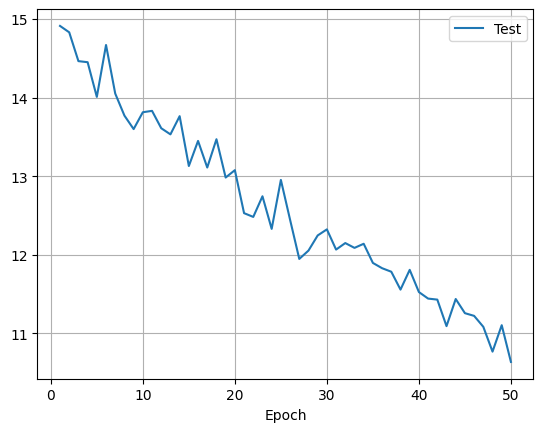

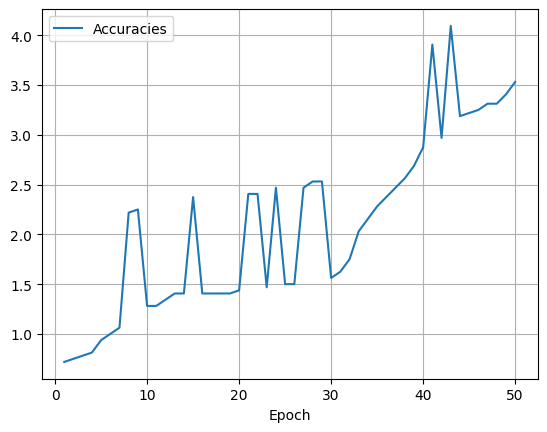

In [34]:
#Define the loss function
#criterion = nn.MSELoss()  # Mean Squared Error for regression tasks
criterion = nn.CrossEntropyLoss()  # For classification tasks

# Define hyperparameters
batch_size = 32
lr = 0.0001 # 1e-3
max_epochs = 50

# Initialize the model, optimizer, and data loader
model = JeresNN(input_size, output_size).to(device)  # Initialize your custom model
train_dataset = torch.utils.data.TensorDataset(X_train_tensor, train_targets_tensor)
train_loader = torch.utils.data.DataLoader(train_dataset, batch_size=batch_size, shuffle=True)

test_dataset = torch.utils.data.TensorDataset(X_test_tensor, test_targets_tensor)
test_loader = torch.utils.data.DataLoader(test_dataset, batch_size=batch_size, shuffle=True)

optimizer = torch.optim.Adam(model.parameters(), lr=lr)

# Classification
test_losses = []
accs = []
for epoch in range(max_epochs):
    model.train()
    epoch_loss = 0

    for X, y in train_loader:
        X = X.to(device)
        y = y.to(device)

        # zero grad
        optimizer.zero_grad()

        # model her
        out = model(X)

        # loss her
        loss = criterion(out, y)
        
        # backward her
        loss.backward()

        # optimizer step her
        optimizer.step()

        # log loss her
        epoch_loss += loss.item()

    #print(epoch_loss)

    test_loss = 0
    test_accs = 0

    model.eval()
    for X_test, y_test in train_loader:
        X_test = X_test.to(device)
        y_test = y_test.to(device)

        # model her
        out = model(X_test)
        preds = torch.argmax(out, dim=1)

        # loss her
        loss = criterion(out, y_test)

        # log loss her
        test_loss += loss.item()

        # accuracy
        preds = out.argmax(dim=1)
        correct = (preds == y_test.argmax(dim=1)).sum().item()

        test_accs += correct / len(X_test)
        
    test_losses.append(test_loss / len(test_loader))
    accs.append(test_accs)


epochs = np.arange(1, len(test_losses)+1)
plt.plot(epochs, test_losses, label="Test")
plt.xlabel("Epoch")
plt.legend()
plt.grid(True)
plt.show()

plt.plot(epochs, accs, label="Accuracies")
plt.xlabel("Epoch")
plt.legend()
plt.grid(True)
plt.show()
        


### Opgave - Evaluering af Jeres Trænede Model

Nu har I det mest basale om hvordan man træner et neuralt netværk, så nu skal I evaluere det. Det er som udgangspunkt bare at sige `model(jeres_data_her)`. Det vigtige er at I skriver `model.eval()` først for at gå ud af trænings mode.

Nu skal I prøve at se hvor langt jeres forudsagte test data er fra de rigtige værdier.

#### For Regression:
- **Standard afvigelse**: `torch.std(forudsigelse - rigtig)` 
- **Root Mean Square Error (RMSE)**: `torch.sqrt(torch.mean((forudsigelse - rigtig)**2))`
- **Mean Absolute Error (MAE)**: `torch.mean(torch.abs(forudsigelse - rigtig))`

#### For Klassifikation:
- **Accuracy (nøjagtighed)**: `torch.mean((forudsigelse > 0.5) == rigtig)` for binær klassifikation
- **For multiclass**: `torch.mean(torch.argmax(forudsigelse, dim=1) == torch.argmax(rigtig, dim=1))`

### Opgave - Eksperimentering og Videreudvikling

Leg med det! Den bedste måde at få en god idé om hvad der virker i machine learning er at eksperimentere mange gange. Derfor synes vi bare I skal lege med det og prøve forskellige ting.

> **📚 Læs først:** Se `NN-forklaring.ipynb` for dybere forståelse af de koncepter der nævnes herunder.

#### Forslag til Eksperimenter

**Grundlæggende Forbedringer:**
- **Validering og Early Stopping** - Se afsnittet om "Validation og Early stopping" i `NN-forklaring.ipynb`
  - Sæt `validation=True` når I loader data
  - Brug `train_model` med validation parametre for automatisk early stopping
  - Implementer jeres eget early stopping i jeres trænings loop

- **Netværksarkitektur** - Se afsnittet om "Matematikken" for forståelse af lag-strukturer
  - Prøv forskellige antal lag (2-6 lag)
  - Eksperimentér med forskellige hidden_dimensions (32, 64, 128, 256)
  - Test forskellige aktiveringsfunktioner mellem lag

**Avancerede Teknikker:**
- **Dropout for Regularisering** - Se afsnittet om "Overtræning" → "Dropout"
  - Tilføj `nn.Dropout(p=0.2)` mellem jeres lag
  - Prøv forskellige dropout rates (0.1, 0.3, 0.5)
  - Sammenlign performance med og uden dropout

- **Forskellige Aktiveringsfunktioner** - Se afsnittet om "Aktiverings Funktioner"
  - Prøv `nn.LeakyReLU()` i stedet for `nn.ReLU()`
  - Test `nn.Tanh()` på hidden lag
  - Eksperimentér med forskellige output aktiveringer baseret på jeres problem type

**Problem-Specifik Eksperimentering:**
- **Klassifikation vs. Regression** - Se afsnittene om "Klassifikation" og "Regression"
  - Sammenlign performance på forskellige datasæt
  - Prøv at konvertere multiclass til binær klassifikation
  - Test forskellige loss funktioner og evalueringsmetrikker

- **Cross Validation** - Se afsnittet om "Cross validation" i `NN-forklaring.ipynb`
  - Implementer k-fold cross validation
  - Sammenlign med simple train/validation split

#### Praktisk Brug af train_model

`train_model` funktionen kan håndtere både evaluering og validering automatisk:

```python
# Fuld setup med validering og test evaluering
history, trained_model = train_model(
    model=model, 
    X_train=X_train_tensor, 
    y_train=train_targets_tensor,
    X_val=X_val_tensor if validation else None,     # Automatisk early stopping
    y_val=val_targets_tensor if validation else None,
    X_test=X_test_tensor,                           # Automatisk test evaluering
    y_test=test_targets_tensor,
    task_type='regression',  # eller 'classification'
    epochs=200,              # Højere da early stopping stopper automatisk
    early_stopping_patience=15  # Stop hvis ingen forbedring i 15 epochs
)
```

#### Debugging og Problemløsning

**Hvis jeres model ikke lærer:** Se "Hvad kan gå galt" sektionerne i `NN-forklaring.ipynb`
- Tjek for overtræning (høj træning accuracy, lav test accuracy)
- Kontroller data skala og normalisering
- Prøv forskellige learning rates
- Undersøg om I har nok data til jeres model kompleksitet

**Hvis I får mærkelige resultater:**
- Sammenlign med baseline (hvad får I hvis I altid gætter gennemsnittet?)
- Visualiser jeres predictions vs. targets
- Tjek om jeres data har bias eller outliers

#### Spørgsmål og Hjælp

Spørg gerne hvis der er noget I har problemer med, eller noget mere I gerne vil prøve! Nogle gode spørgsmål at stille sig selv:

- Hvordan påvirker antal lag performance?
- Hvad sker der hvis I bruger meget små eller store learning rates?
- Kan I finde det optimale antal epochs før overtræning?
- Hvilken aktiverings funktion virker bedst for jeres problem?
- Hvordan påvirker dropout rate performance?

> **💡 Tip:** Start med simple ændringer og byg kompleksiteten op gradvist. Document hvad I prøver så I kan sammenligne resultater!